# The final final code version

In [1]:
#ssh -L 2222:apollo.lcn.ucl.ac.uk:22 jdupatel@galaxy.lcn.ucl.ac.uk
import numpy as np
import os
import tensorflow as tf
import keras
import cv2
from math import ceil, sqrt, floor

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from tqdm import tqdm
from PIL import Image
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

from scipy.ndimage import center_of_mass, label as nd_label, find_objects
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score

from keras import regularizers, layers, models
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from hdbscan import HDBSCAN
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA

from scipy.ndimage import gaussian_filter, center_of_mass

from scipy.stats import skew
from scipy.spatial.distance import cdist

import seaborn as sns
from kneed import KneeLocator

import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import measure

from ipywidgets import interact
import matplotlib.pyplot as plt
from scipy.stats import mode

from collections import Counter

print("TensorFlow version:", tf.__version__)

physical_devices = tf.config.list_physical_devices('GPU')
print("GPUs Available:", physical_devices)

tile_size=32

TensorFlow version: 2.15.0
GPUs Available: []


In [2]:
data_dir = "MSc2024_Data/jpg"

# Lists to store extracted data
image_list = []
image_data_list = []
type_list = []
month_list = []
day_list = []

# Going through the dataset
for dataset_type in ['train', 'test', 'predict']:  # High-level folders
    type_path = os.path.join(data_dir, dataset_type)
    if not os.path.isdir(type_path):
        continue
    
    if dataset_type == 'predict':
        # Predict folder contains only image files
        for file in os.listdir(type_path):
            if file.endswith('.jpg') and not file.startswith('._'):
                image_path = os.path.join(type_path, file)
                with Image.open(image_path) as img:
                    image_array = np.array(img)[:,:,0]/255.0
                
                image_list.append(image_array)
                image_data_list.append("No data")  # No metadata available
                type_list.append('Predict')
                month_list.append('N/A')
                day_list.append('N/A')
    
    else:
        # For train and test folders with month/day substructure
        for month_folder in os.listdir(type_path):  
            month_path = os.path.join(type_path, month_folder)
            if not os.path.isdir(month_path):
                continue
            
            for day_folder in os.listdir(month_path):  
                day_path = os.path.join(month_path, day_folder)
                if not os.path.isdir(day_path):
                    continue
                
                for file in os.listdir(day_path):
                    if file.endswith('.jpg') and not file.startswith('._'):
                        image_path = os.path.join(day_path, file)
                        txt_path = os.path.splitext(image_path)[0] + ".txt"

                        with Image.open(image_path) as img:
                            image_array = np.array(img)[:,:,0]/255.0
                        
                        if os.path.exists(txt_path):
                            with open(txt_path, 'r') as f:
                                image_metadata = f.read().strip()
                        else:
                            image_metadata = "No data"

                        month = month_folder.split('_')[-1]
                        day = int(day_folder.split('_')[-1])

                        image_list.append(image_array)
                        image_data_list.append(image_metadata)
                        type_list.append(dataset_type.capitalize())
                        month_list.append(month)
                        day_list.append(day)


# Create the structured DataFrame
data = pd.DataFrame({
    'Image': image_list,
    'Image data': image_data_list,
    'Type': type_list,
    'Month': month_list,
    'Day': day_list
})

print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1774 entries, 0 to 1773
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Image       1774 non-null   object
 1   Image data  1774 non-null   object
 2   Type        1774 non-null   object
 3   Month       1774 non-null   object
 4   Day         1774 non-null   object
dtypes: object(5)
memory usage: 69.4+ KB
None


In [3]:
# For some reason HPC cluster got updated between regule model and the new model so 
#.h5 and .keras for defectmodel
model = keras.models.load_model('Densemodel/finaltest/32neuronAE.h5')
defectmodel = keras.models.load_model('Densemodel/finaltest/defect_autoencoder_8latent.keras')

model.summary()
defectmodel.summary()

# Extract the encoder and decoder from the full trained model
encoder_split = keras.Model(inputs=model.input, outputs=model.get_layer('dense').output)
decoder_split = keras.Model(inputs=model.get_layer('dense').output, outputs=model.output)

def_encoder_split = keras.Model(inputs=defectmodel.input, outputs=defectmodel.get_layer('dense_1').output)
def_decoder_split = keras.Model(inputs=defectmodel.get_layer('dense_1').output, outputs=defectmodel.output)

c:\Users\jaydi\anaconda3\Lib\site-packages\keras\src\optimizers\base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_1 (InputLayer)            │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 128)    │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       262,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8192)           │       270,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 256)      │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 16, 16, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 3,488,291 (13.31 MB)

 Trainable params: 3,486,753 (13.30 MB)

 Non-trainable params: 1,536 (6.00 KB)

 Optimizer params: 2 (12.00 B)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 512)      │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │         2,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │         2,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 8192)           │     2,105,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 128)      │       589,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 17,012,253 (64.90 MB)

 Trainable params: 5,670,153 (21.63 MB)

 Non-trainable params: 1,792 (7.00 KB)

 Optimizer params: 11,340,308 (43.26 MB)

In [4]:
image_latent_patches  = np.load('latent_patches.npy')
np.random.shuffle(image_latent_patches)
#print(training.shape)
print(image_latent_patches.shape)

scaler = MinMaxScaler()
scaler.fit_transform(image_latent_patches)

image_latent_patches_s = scaler.transform(image_latent_patches)

print('scaled')
print(image_latent_patches_s[0].shape)

(315946, 32)
scaled
(32,)


In [7]:
def filter_and_normalise_patches_chunked(memmap_array, batch_size=1000, threshold=0.05):
    """
    Process large .npy array in chunks: filter patches by zero-pixel ratio
    and normalise each patch to [0, 1] range.

    Parameters:
    - memmap_array: memory-mapped array of shape (N, 32, 32)
    - batch_size: number of patches to load per chunk
    - threshold: max proportion of zero pixels allowed

    Returns:
    - filtered_normalised_patches: numpy array of shape (?, 32, 32)
    """
    N = memmap_array.shape[0]
    results = []

    for i in tqdm(range(0, N, batch_size)):
        batch = memmap_array[i:i+batch_size]

        # Compute zero fraction
        zero_pixel_fraction = np.sum(batch == 0, axis=(1, 2)) / (32 * 32)
        valid_mask = zero_pixel_fraction < threshold

        # Filter valid patches
        valid_patches = batch[valid_mask]

        # Normalise each patch individually to [0, 1]
        min_vals = valid_patches.reshape(valid_patches.shape[0], -1).min(axis=1, keepdims=True)
        max_vals = valid_patches.reshape(valid_patches.shape[0], -1).max(axis=1, keepdims=True)
        ranges = max_vals - min_vals + 1e-8  # prevent division by zero

        normalised = ((valid_patches.reshape(valid_patches.shape[0], -1) - min_vals) / ranges).reshape(-1, 32, 32)

        results.append(normalised)

    return np.concatenate(results, axis=0)

# Example usage
patches_memmap = np.load('defect_patches_unknown.npy', mmap_mode='r')
all_defects_array = filter_and_normalise_patches_chunked(patches_memmap, batch_size=1000)

print(all_defects_array.shape)

sample_indices = np.random.choice(all_defects_array.shape[0], size=200000, replace=False)
defect_sample = all_defects_array[sample_indices]

defect_ae_latent = def_encoder_split.predict(defect_sample)
print(defect_ae_latent.shape)
defscaler = MinMaxScaler()
defect_latent_s = defscaler.fit_transform(defect_ae_latent)

100%|██████████| 505/505 [00:22<00:00, 22.62it/s]


(444080, 32, 32)
6250/6250 ━━━━━━━━━━━━━━━━━━━━ 191s 30ms/step
(200000, 8)


In [9]:
# optimalk_all = 7
kmeansall = KMeans(n_clusters=7, random_state=27, n_init=10)
kmeanslabels = kmeansall.fit_predict(image_latent_patches_s)

gmm = GaussianMixture(n_components=20, covariance_type='full', random_state=42)
gmm.fit_predict(defect_latent_s)

array([13, 18, 15, ...,  7, 13, 14], dtype=int64)

In [61]:
def sliding_window(image, window_size, stride):
    '''
    Extracts square patches from a 2D image using a sliding window approach.

    Description:
        This function moves a fixed-size window across the input image at defined strides.
        At each position, it extracts a patch (sub-array) and records the top-left coordinate
        of that patch within the original image.

    Inputs:
        image (np.ndarray): 2D input image array of shape (H, W).
        window_size (int): Size of the square window (window_size x window_size).
        stride (int): Step size to move the window in both vertical and horizontal directions.

    Outputs:
        patches (List[np.ndarray]): List of extracted image patches, each of shape (window_size, window_size).
        positions (List[Tuple[int, int]]): List of (row, col) coordinates indicating the top-left corner
                                           of each extracted patch in the original image.
    '''
    h, w, = image.shape
    patches = []
    positions = []
    for i in range(0, h - window_size + 1, stride):
        for j in range(0, w - window_size + 1, stride):
            patch = image[i:i + window_size, j:j + window_size]
            patches.append(patch)
            positions.append((i, j))
    return patches, positions

def mode_image(image, encoder, cluster_model, scaler, window_size=tile_size, stride=2):
    '''
    Generates a characterisation map of an image by encoding patches and clustering their latent features.

    Description:
        This function slides a window across the input image to extract patches. Each patch is encoded 
        using a trained encoder to obtain a latent representation, which is then standardised and clustered. 
        The resulting cluster labels are used to assign each pixel a class based on majority voting from 
        overlapping patches. The final output is a 2D map of cluster assignments.

    Inputs:
        image: 2D input array representing the image.
        encoder: Trained encoder model that outputs latent vectors from image patches.
        cluster_model: Clustering model (e.g. KMeans, DBSCAN, HDBSCAN) used to classify latent vectors.
        scaler: Fitted scaler used to normalise latent vectors before clustering.
        window_size: Size of the sliding window (default: tile_size).
        stride: Number of pixels the window moves in each direction (default: 2).

    Outputs:
        char_map: 2D array of the same shape as the input image, where each pixel is assigned a cluster label.
                  Pixels that are not assigned to any cluster are marked with -1.
    '''
    patches, positions = sliding_window(image, window_size, stride)

    # Get latent vectors for all patches
    latent_vector_patch = [encoder(patch.reshape(1, window_size, window_size, 1)).numpy().flatten()
                           for patch in tqdm(patches)]
    latent_flattened = np.array(latent_vector_patch)


    latent_flattened = scaler.transform(latent_flattened)

    # Clustering
    cluster_ids = cluster_model.fit_predict(latent_flattened)

    # Initialize character map and vote storage
    char_map = np.full(image.shape[:2], -1, dtype=int)  # Initialize as -1 (unassigned)
    vote_dict = {}  # Stores votes for each pixel location

    for (i, j), cluster_id in zip(positions, cluster_ids):
        if cluster_id == -1:
            continue  # Ignore noise
        for x in range(i, i + window_size):
            for y in range(j, j + window_size):
                if 0 <= x < image.shape[0] and 0 <= y < image.shape[1]:  # Ensure within bounds
                    if (x, y) not in vote_dict:
                        vote_dict[(x, y)] = []
                    vote_dict[(x, y)].append(cluster_id)

    # Apply majority voting per pixel
    for (x, y), votes in vote_dict.items():
        char_map[x, y] = Counter(votes).most_common(1)[0][0]  # Most common cluster ID

    return char_map

def find_medoids(latent_vectors_train, labels, sample_size=100):
    unique_labels = np.unique(labels)
    medoids = []

    for label in tqdm(unique_labels):
        # Get points belonging to the current cluster
        cluster_points = latent_vectors_train[labels == label]
        n_points = len(cluster_points)

        # Reduce computations for large clusters by sampling
        if n_points > sample_size:
            sampled_indices = np.random.choice(n_points, size=sample_size, replace=False)
            cluster_points = cluster_points[sampled_indices]

        # Compute pairwise distances within the sampled cluster
        distances = pairwise_distances(cluster_points)

        # Find the medoid (point with the smallest sum of distances)
        medoid_index = np.argmin(distances.sum(axis=0))
        medoids.append(cluster_points[medoid_index])

    return np.array(medoids)

def compareimage_choose(original, char, selected_group=None):
    '''ChatGPTed'''
    fig, ax = plt.subplots(1, 4, figsize=(15, 5), dpi=500)

    # First image: Original
    ax[0].imshow(original, origin='upper', cmap='viridis')
    ax[0].set_title('Original Image')
    
    ax[1].imshow(char, cmap='RdBu')
    ax[1].set_title('Character Map')

    # Second image: Character map (filtered if group selected)
    if selected_group is not None:
        char_filtered = np.where(char == selected_group, char, np.nan)  # Set non-selected groups to NaN
        ax[2].imshow(original, cmap='viridis')
        color = ax[2].imshow(char_filtered, cmap='RdBu', origin='upper', vmin=np.nanmin(char), vmax=np.nanmax(char))
        ax[2].set_title(f'Character map (Group {selected_group})')
    else:
        color = ax[2].imshow(char, cmap='RdBu', origin='upper')
        ax[2].set_title('Character map (All groups)')

    fig.colorbar(color, ax=ax[1], orientation='vertical', fraction=0.05)

    # Third image: Overlay
    im = ax[3].imshow(original, origin='upper', cmap='viridis')
    im_overlay = ax[3].imshow(char, alpha=0.4, cmap='RdBu', origin='upper')
    fig.colorbar(im_overlay, ax=ax[3], orientation='vertical', fraction=0.05)
    ax[3].set_title('Overlay')

    for axs in ax:
        axs.axis('off')

    plt.show()

def interactive_compareimage(og, char):
    '''ChatGPTed'''
    unique_groups = np.unique(char[char != -1])  # Exclude noise if needed
    
    def update(selected_group):
        compareimage_choose(og, char, selected_group)
    
    interact(update, selected_group=[None] + list(unique_groups))  # Add None for all groups

def extract_high_error_patches(original_image, model, tile_size=32, stride=8, min_dist=10, plot_maps=False, plot_defects=False):
    '''
    Identifies and extracts high-error patches from an image using autoencoder reconstruction error.

    Description:
        This function slides a window across the input image and reconstructs each patch using a trained
        autoencoder model. The reconstruction error is computed for each patch and aggregated into an 
        error map. High-error regions are extracted based on a dynamic threshold, and optionally filtered 
        using non-maximum suppression to avoid duplicates. Visualisation options are available to inspect
        both the error map and the detected defect patches.

    Inputs:
        original_image: 2D input array representing the image.
        model: Trained autoencoder model used for patch reconstruction.
        tile_size: Size of the square patch to slide over the image (default: 32).
        stride: Step size for the sliding window (default: 8).
        min_dist: Minimum distance between extracted defect centres (default: 10).
        plot_maps: If True, plots the original image, error map, and defect locations (default: False).
        plot_defects: If True, displays the extracted defect patches in a grid (default: False).

    Outputs:
        error_map: 2D array of the same shape as the input image containing smoothed reconstruction error values.
        defect_patches: List of 2D arrays representing extracted high-error patches.
        centers: List of (x, y) tuples indicating the coordinates of each extracted patch's centre.
    '''

    h, w = original_image.shape
    half_tile = tile_size // 2

    error_map = np.zeros((h, w))
    count_map = np.zeros((h, w))

    # Step 1: Compute reconstruction error map
    for y in tqdm(range(0, h, stride)):
        for x in range(0, w, stride):
            y1, y2 = min(y, h - tile_size), min(y + tile_size, h)
            x1, x2 = min(x, w - tile_size), min(x + tile_size, w)

            patch = original_image[y1:y2, x1:x2]
            if patch.shape != (tile_size, tile_size):
                patch = cv2.copyMakeBorder(patch, 0, tile_size - patch.shape[0], 0, tile_size - patch.shape[1], cv2.BORDER_REFLECT)

            patch_input = patch.reshape(1, tile_size, tile_size, 1)
            reconstructed_patch = model.predict(patch_input, verbose=0)[0].reshape(tile_size, tile_size)

            error_patch = np.abs(patch - reconstructed_patch) ** 2
            error_map[y1:y2, x1:x2] += error_patch
            count_map[y1:y2, x1:x2] += 1

    count_map[count_map == 0] = 1
    error_map /= count_map
    raw_map = error_map.copy()

    # Step 2: Smooth error map and compute threshold
    sigma = max(2, np.std(error_map) / 5)
    error_map = gaussian_filter(error_map, sigma=sigma)

    error_skewness = skew(raw_map.flatten())
    threshold_percentile = 97 + 2 * min(1, error_skewness)
    threshold = np.percentile(error_map, threshold_percentile)

    high_error_ratio = np.sum(error_map > threshold) / error_map.size
    if high_error_ratio > 0.2:
        error_map = np.max(error_map) - error_map
        print("Error map flipped due to high error coverage.")

    defect_mask = (error_map > threshold).astype(np.uint8)

    # Step 3: Label and extract defect regions
    labeled_mask, num_labels = nd_label(defect_mask)
    defect_patches, centers, error_values = [], [], []

    for label_idx in range(1, num_labels + 1):
        region_mask = (labeled_mask == label_idx)
        y, x = center_of_mass(region_mask)

        if np.isnan(y) or np.isnan(x):
            continue

        y, x = int(round(y)), int(round(x))
        y = np.clip(y, half_tile, h - half_tile - 1)
        x = np.clip(x, half_tile, w - half_tile - 1)

        y1, y2 = max(0, y - half_tile), min(h, y + half_tile)
        x1, x2 = max(0, x - half_tile), min(w, x + half_tile)
        patch = original_image[y1:y2, x1:x2]

        if patch.shape != (tile_size, tile_size):
            patch = cv2.copyMakeBorder(
                patch,
                top=max(0, half_tile - y), bottom=max(0, y + half_tile - h),
                left=max(0, half_tile - x), right=max(0, x + half_tile - w),
                borderType=cv2.BORDER_CONSTANT, value=0
            )

        defect_patches.append(patch)
        centers.append((x, y))
        error_values.append(error_map[y, x])

    # Step 4: Non-Maximum Suppression
    if min_dist > 0 and defect_patches:
        filtered_centers, filtered_patches = [], []
        error_values = np.array(error_values)
        sorted_indices = np.argsort(-error_values)
        selected = np.zeros(len(centers), dtype=bool)

        for i in sorted_indices:
            if selected[i]:
                continue
            x1, y1 = centers[i]
            filtered_centers.append((x1, y1))
            filtered_patches.append(defect_patches[i])
            selected[i] = True

            distances = np.linalg.norm(np.array(centers) - np.array([x1, y1]), axis=1)
            selected[distances < min_dist] = True

        centers, defect_patches = filtered_centers, filtered_patches

    # Step 5: Visualise maps
    if plot_maps:
        fig, axs = plt.subplots(1, 3, figsize=(15, 5), dpi=150)
        axs[0].imshow(original_image, cmap='viridis')
        axs[0].set_title('Original STM Image')

        axs[1].imshow(error_map, cmap='hot')
        axs[1].set_title(f'Error Map (Threshold: {threshold_percentile:.2f})')

        axs[2].imshow(original_image, cmap='viridis')
        axs[2].set_title('Detected Defects')

        for x, y in centers:
            axs[1].scatter(x, y, color='green', marker='x', lw=1, s=10)
            axs[2].scatter(x, y, color='black', marker='x', lw=1, s=10)

        for ax in axs:
            ax.axis('off')
        plt.show()

    # Step 6: Visualise patches
    if plot_defects and defect_patches:
        num_patches = len(defect_patches)
        grid_size = ceil(sqrt(num_patches))
        fig, axs = plt.subplots(grid_size, grid_size, figsize=(grid_size * 2, grid_size * 2))
        axs = axs.flatten()

        for i, patch in enumerate(defect_patches):
            axs[i].imshow(patch, cmap='viridis')
            axs[i].axis('off')
            axs[i].set_title(f'Defect {i+1}')

        for j in range(i + 1, len(axs)):
            axs[j].axis('off')

    return error_map, defect_patches, centers

def generate_fine_characterization_mask(original_image, char_map, error_map, target_clusters, error_percentile=90, plot_mask=False):
    '''
    Generates a binary mask highlighting regions for fine-grained characterization.

    Description:
        This function combines information from a coarse characterization map and an error map to identify
        regions of interest for further analysis. It marks pixels that either:
        - Belong to specified target clusters in the characterization map, or
        - Have reconstruction error above a certain percentile threshold.
        The resulting binary mask can be visualised over the original image.

    Inputs:
        original_image: 2D array representing the original STM image.
        char_map: 2D array of the same shape as the image, containing coarse cluster labels.
        error_map: 2D array of reconstruction error values from an autoencoder.
        target_clusters: List of integer cluster labels to highlight in the output mask.
        error_percentile: Percentile threshold above which pixels are marked as high-error (default: 90).
        plot_mask: If True, displays visualisations of the input maps and final mask (default: False).

    Outputs:
        fine_characterization_mask: 2D binary array of the same shape as the input image, where 1 indicates
                                    regions selected for fine characterization and 0 otherwise.
    '''

    h, w = original_image.shape

    # Step 1: Identify high-error regions
    error_threshold = np.percentile(error_map, error_percentile)
    high_error_mask = error_map > error_threshold

    # Step 2: Identify regions belonging to target clusters
    cluster_mask = np.isin(char_map, target_clusters)

    # Step 3: Combine masks
    fine_characterization_mask = (high_error_mask | cluster_mask).astype(np.uint8)

    # Step 4: Optional visualisation
    if plot_mask:
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 4, 1)
        plt.imshow(original_image, cmap='viridis')
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(original_image, cmap='viridis')
        char_overlay = plt.imshow(char_map, cmap='RdBu', alpha=0.6)
        plt.colorbar(char_overlay, fraction=0.046, pad=0.04)
        plt.title('Characterization Map')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(error_map, cmap='hot')
        plt.title('Error Map')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(original_image, cmap='viridis')
        mask_overlay = plt.imshow(fine_characterization_mask, cmap='binary', alpha=0.5)
        plt.colorbar(mask_overlay, fraction=0.046, pad=0.04)
        plt.title('Fine Characterization Mask')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return fine_characterization_mask

def clean_and_round_blobs(mask, shrink_iterations=3, grow_iterations=5, kernel_size=5,
                          line_threshold=1.2, sigma=0.2, plot_mask=True):
    '''
    Cleans and rounds detected blobs in a binary mask by removing elongated regions and smoothing shapes.

    Description:
        This function refines a binary blob mask by first shrinking it (erosion), applying Gaussian smoothing, 
        and then expanding it (dilation). It then removes line-like or elongated regions based on aspect ratio,
        leaving only more compact and circular blobs. Visualisation of the processing steps is optional.

    Inputs:
        mask: 2D binary numpy array where blobs are marked with 1 (foreground) and background with 0.
        shrink_iterations: Number of erosion passes to apply (default: 3).
        grow_iterations: Number of dilation passes to apply after smoothing (default: 5).
        kernel_size: Size of the elliptical structuring element used for morphological operations (default: 5).
        line_threshold: Minimum aspect ratio (length/width) to consider a region as an elongated line (default: 1.2).
        sigma: Standard deviation for Gaussian filter applied after erosion (default: 0.2).
        plot_mask: If True, visualises intermediate processing steps (default: True).

    Outputs:
        clean_mask: 2D binary numpy array with cleaned, rounded blobs (elongated lines removed).
    '''

    # Create elliptical structuring element
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

    # Step 1: Shrink blobs
    eroded_mask = cv2.erode(mask, kernel, iterations=shrink_iterations)

    # Step 2: Smooth with Gaussian filter
    gauss_mask = gaussian_filter(eroded_mask.astype(float), sigma=sigma)

    # Step 3: Grow blobs
    grown_mask = cv2.dilate(gauss_mask, kernel, iterations=grow_iterations)

    # Step 4: Label and filter elongated regions
    labeled_mask = nd_label(grown_mask > 0)[0]  # Binarise and label connected components
    clean_mask = np.zeros_like(mask)

    for region in measure.regionprops(labeled_mask):
        min_row, min_col, max_row, max_col = region.bbox
        height = max_row - min_row
        width = max_col - min_col
        aspect_ratio = max(height / (width + 1e-5), width / (height + 1e-5))

        if aspect_ratio < line_threshold:
            clean_mask[min_row:max_row, min_col:max_col] = (
                labeled_mask[min_row:max_row, min_col:max_col] == region.label
            )

    # Step 5: Plot if required
    if plot_mask:
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))
        titles = ['Original Mask', 'Eroded', 'Gaussian Smoothed', 'Grown', 'Lines Removed']
        images = [mask, eroded_mask, gauss_mask, grown_mask, clean_mask]

        for ax, img, title in zip(axes, images, titles):
            ax.imshow(img, cmap='gray')
            ax.set_title(title)
            ax.axis('off')

        plt.tight_layout()
        plt.show()

    return clean_mask

def clean_defect_mask(binary_mask, min_area=75, kernel_size=3):
    '''
    Cleans a binary defect mask by removing noise and small components.

    Description:
        This function refines a binary mask by first removing connected regions smaller
        than a specified area threshold. It then applies morphological opening to smooth
        boundaries and eliminate thin artifacts or isolated pixels.

    Inputs:
        binary_mask: 2D binary array (0/1 or boolean) representing the defect mask.
        min_area: Minimum size (in pixels) of a connected region to keep (default: 75).
        kernel_size: Size of the square structuring element used in morphological opening (default: 3).

    Outputs:
        cleaned_mask: 2D binary array of the same shape as the input, with small and noisy components removed.
    '''

    # Ensure binary input
    binary_mask = (binary_mask > 0).astype(np.uint8)

    # Step 1: Remove small connected components
    labels = measure.label(binary_mask, connectivity=2)
    cleaned_mask = np.zeros_like(binary_mask)

    for region in measure.regionprops(labels):
        if region.area >= min_area:
            cleaned_mask[labels == region.label] = 1

    # Step 2: Morphological opening
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_OPEN, kernel)

    return cleaned_mask

def extract_masked_patches_and_cluster(original_image, fine_mask, encoder, clusterer, scaler, 
                                       tile_size=32, min_dist=16, 
                                       plot_overlay=True, plot_defects=True):
    '''
    Extracts patches from a fine characterization mask and clusters them using a latent encoder.

    Description:
        This function scans a binary fine mask to locate defect regions, from which patches are extracted.
        Small regions yield a single centred patch, while larger ones are tiled. All patches are passed 
        through a trained encoder to obtain latent features, which are then scaled and clustered. 
        Optionally, the clustered defects can be visualised both on the original image and in a patch grid.

    Inputs:
        original_image: 2D array representing the original STM image.
        fine_mask: 2D binary mask highlighting regions for fine characterization.
        encoder: Trained encoder model that converts image patches into latent vectors.
        clusterer: Clustering model (e.g. KMeans, DBSCAN) used to group encoded features.
        scaler: Fitted scaler for normalising encoded features before clustering.
        tile_size: Size of each square patch to extract (default: 32).
        min_dist: Minimum stride between patches in larger regions (default: 16).
        plot_overlay: If True, plots patches and cluster labels over the original image (default: True).
        plot_defects: If True, displays the clustered patches in a grid (default: True).

    Outputs:
        cluster_labels: List of cluster IDs assigned to each extracted patch.
        defect_patches: List of 2D arrays representing the extracted patches.
        centers: List of (x, y) tuples for the centre of each extracted patch.
    '''

    h, w = original_image.shape
    half_tile = tile_size // 2

    labeled_mask, num_labels = nd_label(fine_mask)
    print(f"Number of regions detected: {num_labels}")

    defect_patches = []
    centers = []
    stride = min_dist

    # Step 1: Extract patches based on region size
    for region in measure.regionprops(labeled_mask):
        cy, cx = map(int, map(round, region.centroid))
        y0, x0, y1, x1 = region.bbox
        region_h, region_w = y1 - y0, x1 - x0

        if region_h <= tile_size and region_w <= tile_size:
            # Small region: single patch
            y1_patch = max(0, min(h - tile_size, cy - half_tile))
            x1_patch = max(0, min(w - tile_size, cx - half_tile))
            patch = original_image[y1_patch:y1_patch + tile_size, x1_patch:x1_patch + tile_size]
            if patch.shape == (tile_size, tile_size):
                norm_patch = (patch - np.min(patch)) / (np.max(patch) - np.min(patch) + 1e-8)
                defect_patches.append(norm_patch)
                centers.append((x1_patch + half_tile, y1_patch + half_tile))
        else:
            # Larger region: tile with stride
            num_y_tiles = max(1, floor((region_h - tile_size) / stride) + 1)
            num_x_tiles = max(1, floor((region_w - tile_size) / stride) + 1)

            for i in range(num_y_tiles):
                for j in range(num_x_tiles):
                    y = y0 + i * stride
                    x = x0 + j * stride
                    if y + tile_size > h or x + tile_size > w:
                        continue
                    patch = original_image[y:y + tile_size, x:x + tile_size]
                    if patch.shape == (tile_size, tile_size):
                        norm_patch = (patch - np.min(patch)) / (np.max(patch) - np.min(patch) + 1e-8)
                        defect_patches.append(norm_patch)
                        centers.append((x + half_tile, y + half_tile))

    if not defect_patches:
        return [], [], []

    # Step 2: Encode and scale features
    defect_array = np.array(defect_patches)
    defect_features = encoder.predict(defect_array)
    defect_features = scaler.transform(defect_features)

    # Step 3: Clustering
    if len(defect_features) < 20:
        cluster_labels = clusterer.predict(defect_features)
    
    else: 
        cluster_labels = clusterer.fit_predict(defect_features)
    # Step 4: Visualise overlay
    if plot_overlay:
        plt.figure(figsize=(8, 8), dpi=100)
        plt.imshow(original_image, cmap='viridis')
        ax = plt.gca()

        for (x, y), cluster in zip(centers, cluster_labels):
            rect = plt.Rectangle((x - half_tile, y - half_tile), tile_size, tile_size,
                                 linewidth=1.5, edgecolor='k', facecolor='none')
            ax.add_patch(rect)
            plt.text(x + 16, y + 16, str(cluster), color='red', fontsize=10,
                     ha='center', va='center')

        plt.title("Clustered Defects from Fine Mask")
        plt.axis('off')
        plt.show()

    # Step 5: Plot grouped patches
    if plot_defects:
        print('Plotting')
        sorted_idx = np.argsort(cluster_labels)
        sorted_patches = [defect_patches[i] for i in sorted_idx]
        sorted_labels = [cluster_labels[i] for i in sorted_idx]

        num_patches = len(sorted_patches)
        grid_size = ceil(sqrt(num_patches))
        fig, axs = plt.subplots(grid_size, grid_size, figsize=(grid_size * 2, grid_size * 2))
        axs = axs.flatten()

        for i, (patch, label) in enumerate(zip(sorted_patches, sorted_labels)):
            axs[i].imshow(patch, cmap='viridis', vmin=0, vmax=1)
            axs[i].axis('off')
            axs[i].set_title(f'Group {label}')

        for j in range(i + 1, len(axs)):
            axs[j].axis('off')

        plt.tight_layout()
        plt.show()

    return cluster_labels, defect_patches, centers

In [71]:
image = (data[(data['Type'] == 'Predict')].iloc[7]['Image'])
# image 17 doesn't work
# image 27 has large steps so lots of erroneuous points
char_map = mode_image(image, encoder_split, kmeansall, scaler, stride=8)
interactive_compareimage(image, char_map)

100%|██████████| 1156/1156 [00:41<00:00, 27.67it/s]


interactive(children=(Dropdown(description='selected_group', options=(None, 0, 1, 2, 3, 4, 5, 6), value=None),…

100%|██████████| 13/13 [00:29<00:00,  2.25s/it]


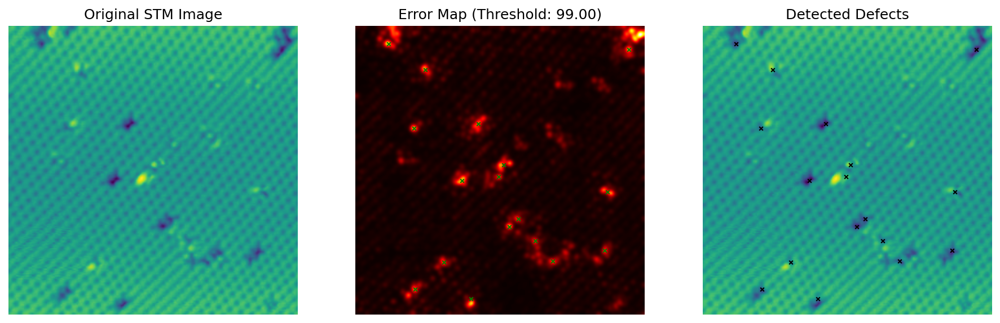

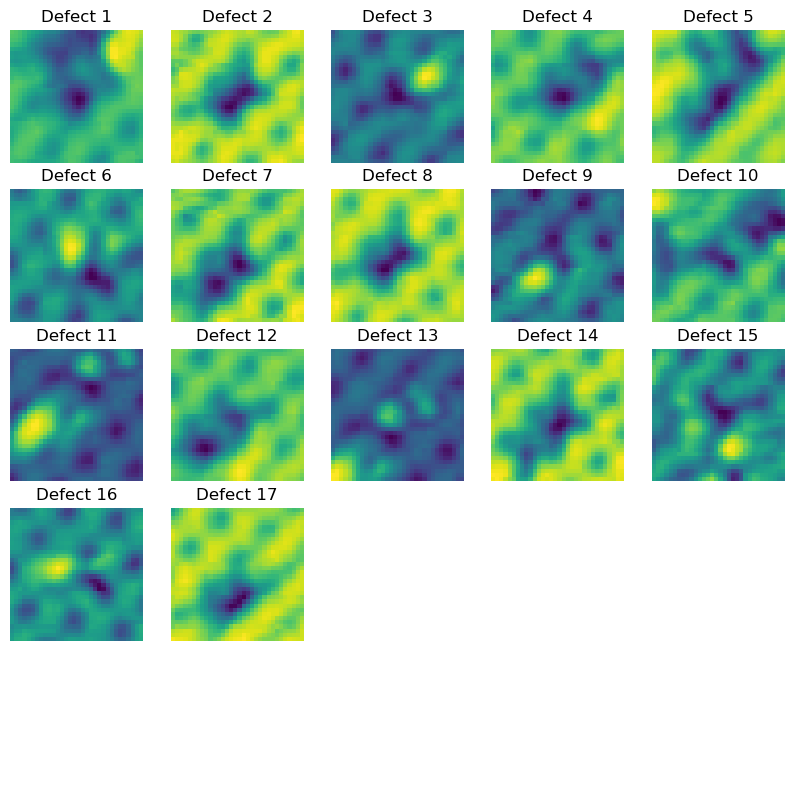

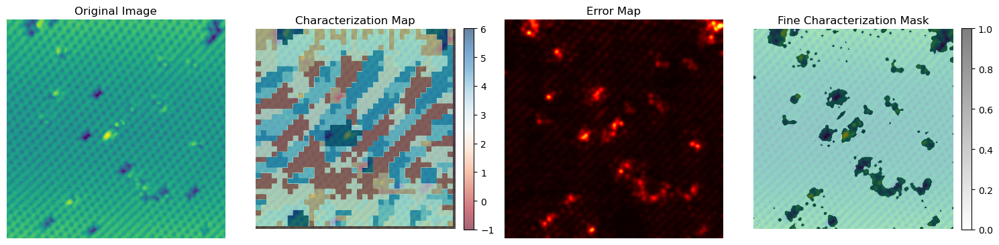

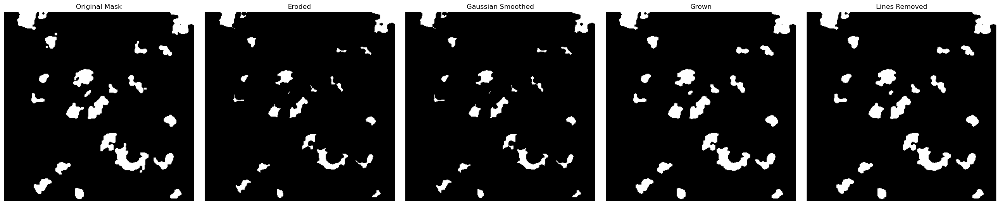

Number of regions detected: 23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


c:\Users\jaydi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


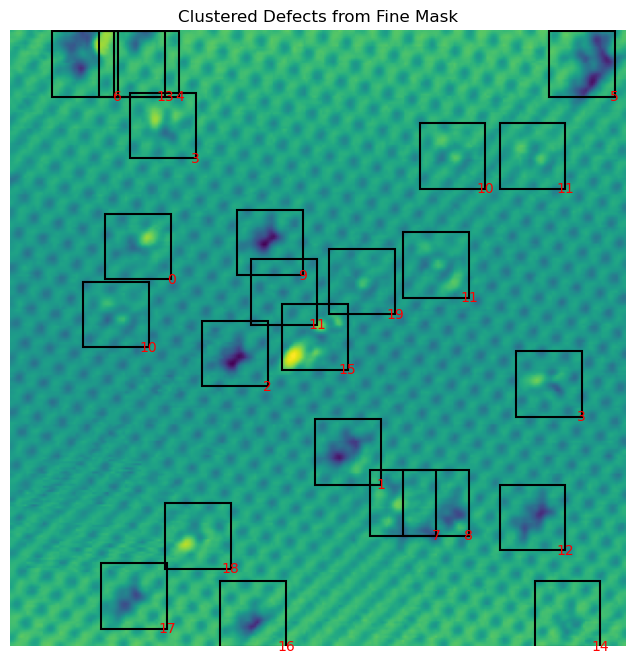

Plotting


  0%|          | 102/20449 [34:00<113:03:05, 20.00s/it]


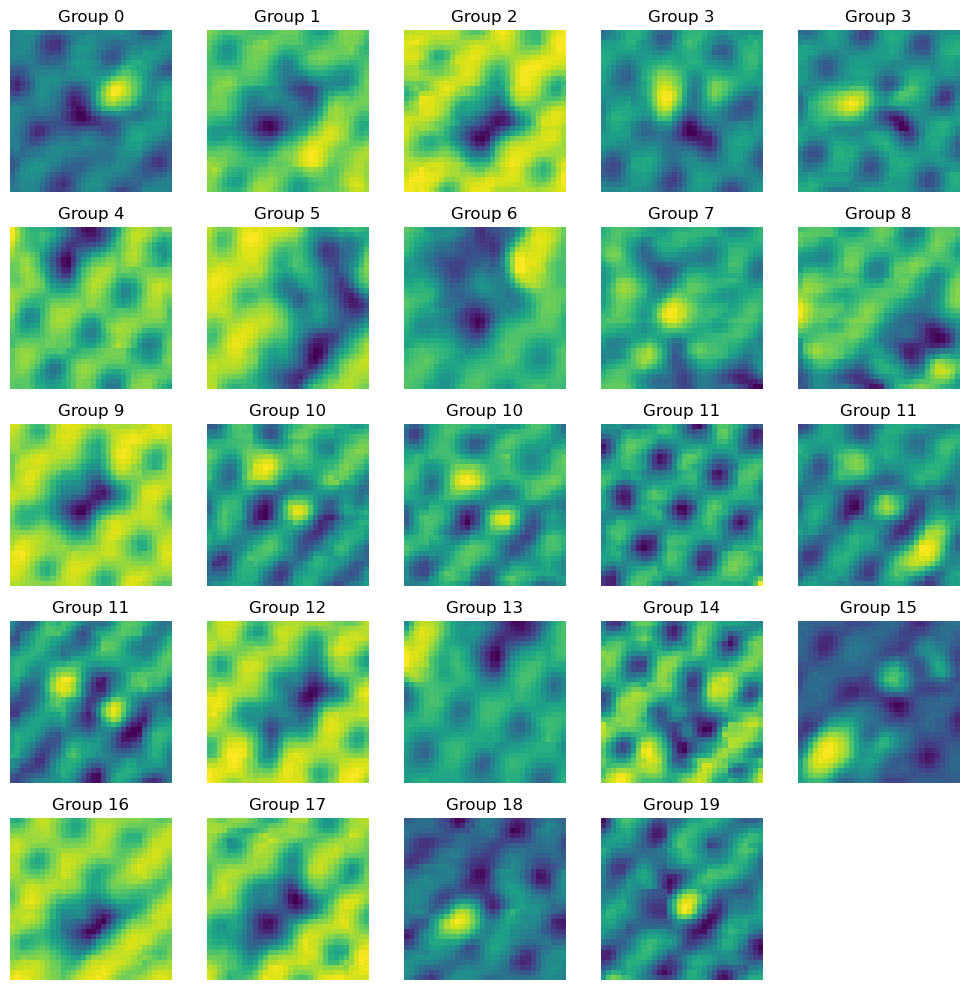

In [73]:
error_map, defect_patches, defect_centers = extract_high_error_patches(image, model, stride=24, plot_maps=True, plot_defects=True)
fine_map = generate_fine_characterization_mask(image, char_map, error_map, defect_centers, plot_mask=True, error_percentile=90)

cleaned_mask = clean_defect_mask(fine_map, min_area=60)

eroded_mask = clean_and_round_blobs(
    cleaned_mask,
    shrink_iterations=1,
    grow_iterations=1,
    kernel_size=5,
    line_threshold=3,
    sigma=0.1)

cluster_labels, filtered_patches, filtered_centers = extract_masked_patches_and_cluster(
    image, eroded_mask, def_encoder_split, gmm, defscaler, min_dist=16, plot_overlay=True, plot_defects=True)

In [76]:
char_map = mode_image(image, def_encoder_split, gmm, defscaler, stride=2)
interactive_compareimage(image, char_map)

100%|██████████| 18225/18225 [08:24<00:00, 36.12it/s]


interactive(children=(Dropdown(description='selected_group', options=(None, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, …

(-0.5, 299.5, 299.5, -0.5)

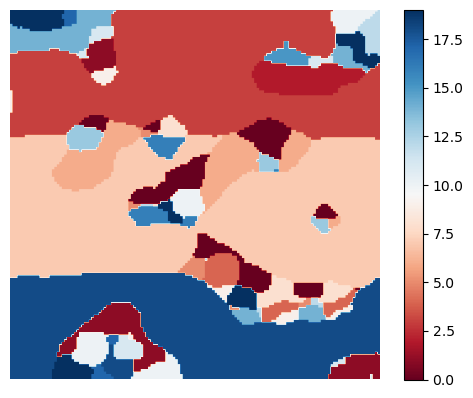

In [81]:
plt.imshow(char_map, cmap='RdBu')
plt.colorbar()
plt.axis('off')

100%|██████████| 5184/5184 [02:43<00:00, 31.67it/s]


interactive(children=(Dropdown(description='selected_group', options=(None, 0, 1, 2, 3, 4, 5, 6), value=None),…

100%|██████████| 25/25 [01:34<00:00,  3.79s/it]


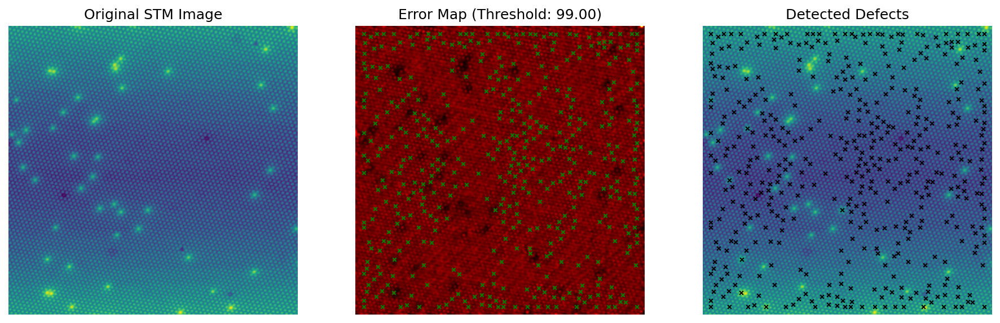

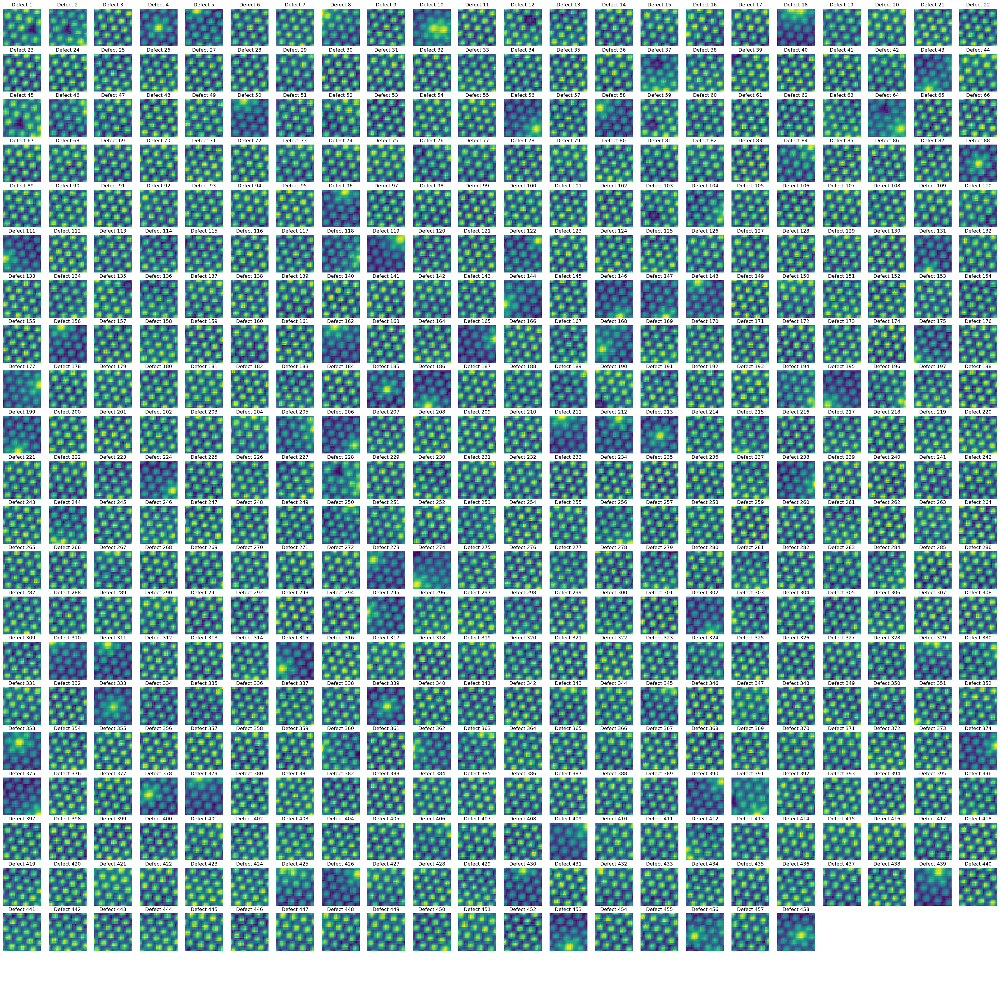

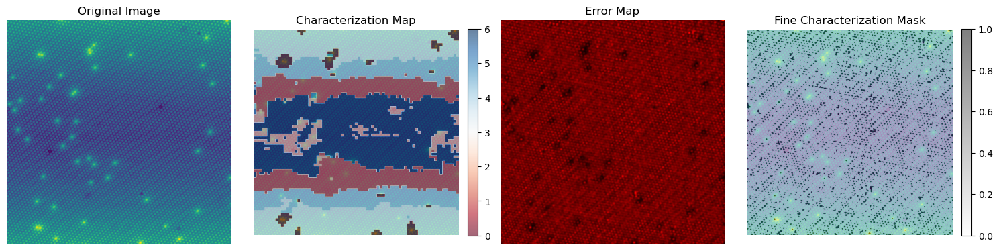

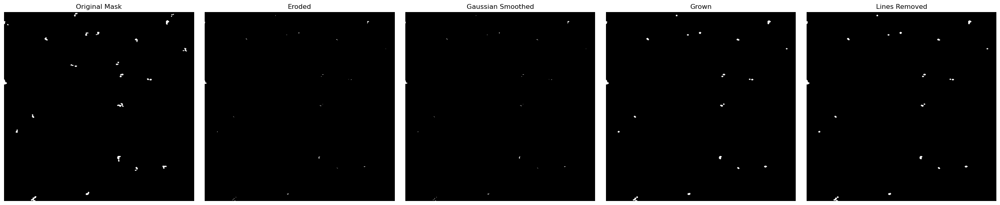

Number of regions detected: 24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


c:\Users\jaydi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


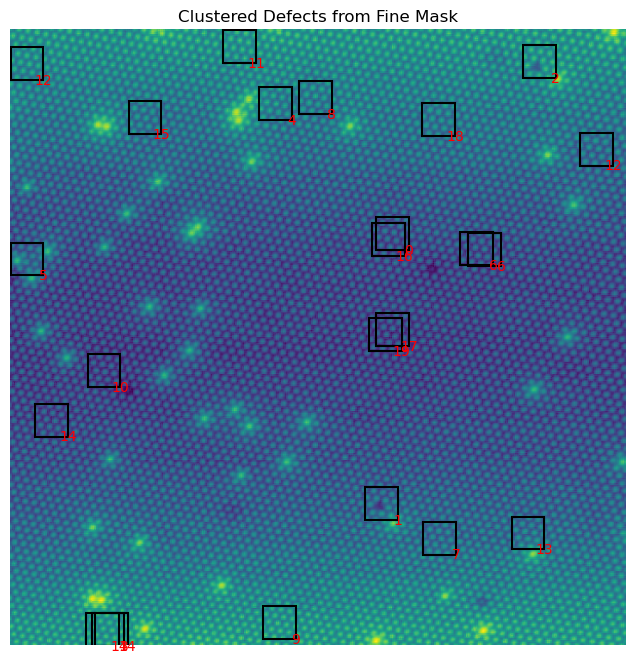

Plotting


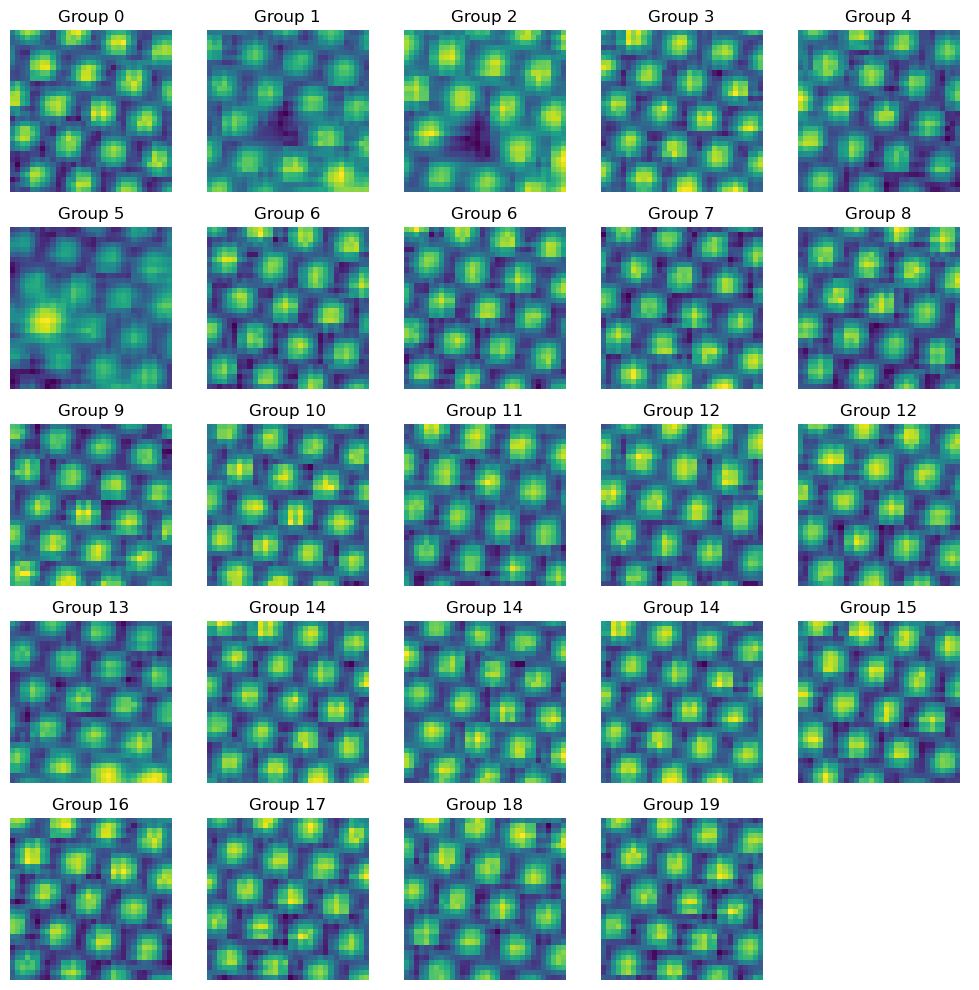

100%|██████████| 8100/8100 [05:04<00:00, 26.60it/s]


interactive(children=(Dropdown(description='selected_group', options=(None, 0, 1, 2, 3, 4, 5, 6), value=None),…

100%|██████████| 32/32 [02:36<00:00,  4.89s/it]


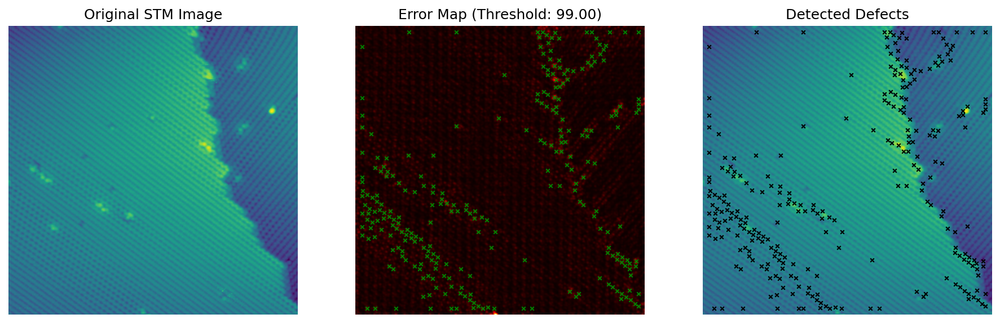

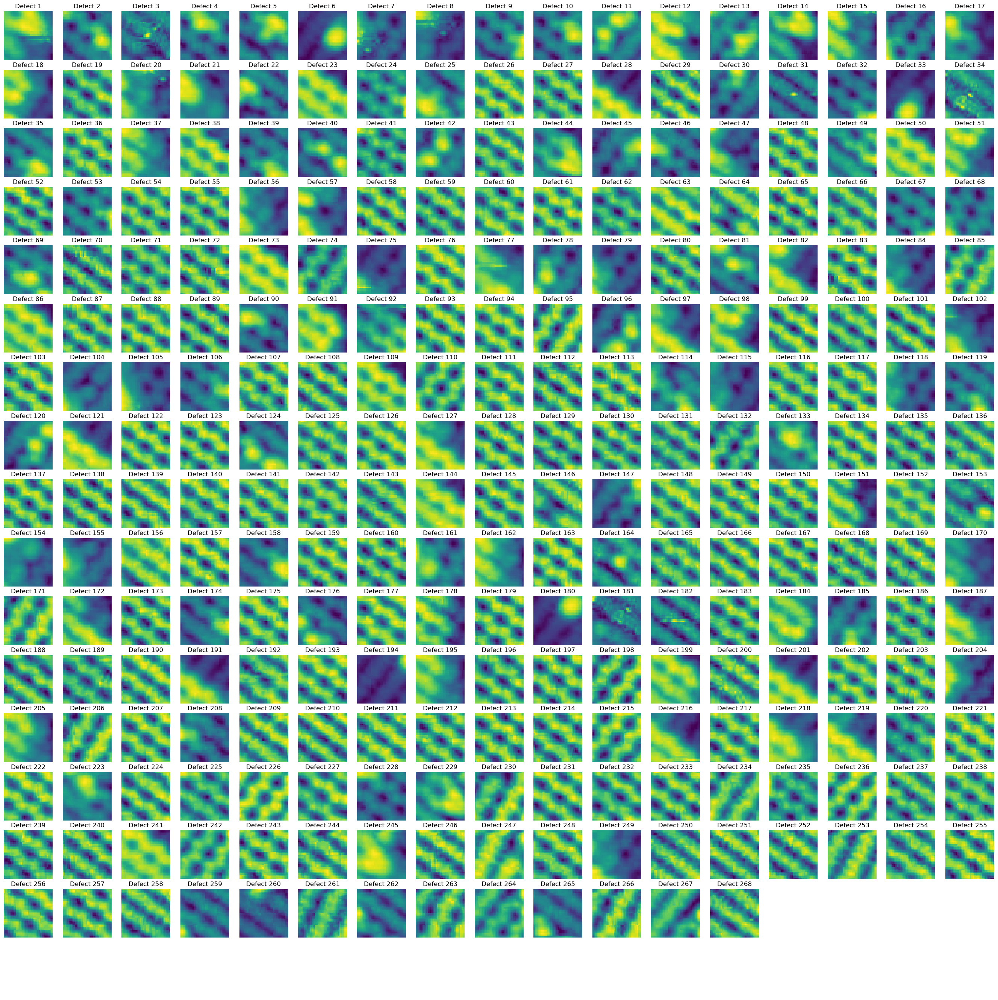

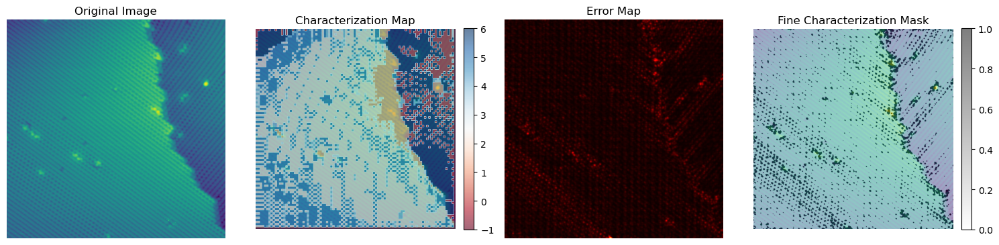

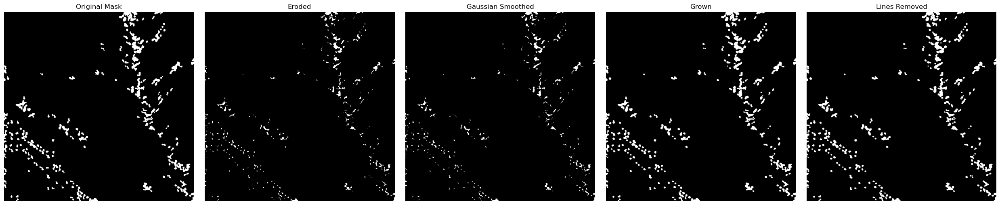

Number of regions detected: 227
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step


c:\Users\jaydi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


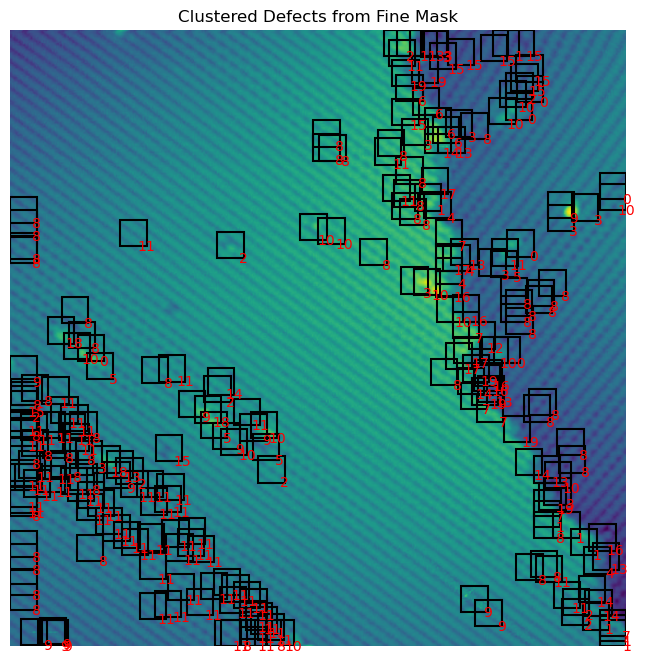

Plotting


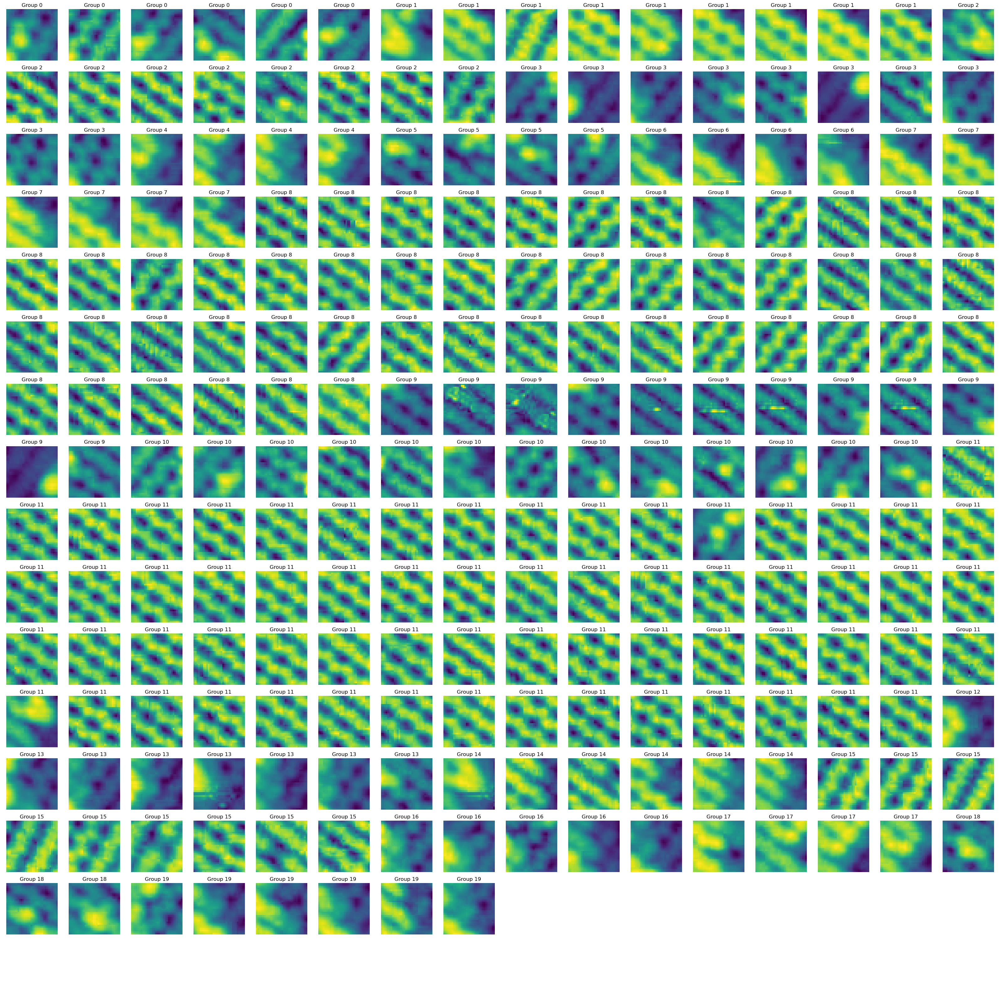

In [82]:
image = (data[(data['Type'] == 'Predict')].iloc[17]['Image'])
# image 17 doesn't work
# image 27 has large steps so lots of erroneuous points
char_map = mode_image(image, encoder_split, kmeansall, scaler, stride=8)
interactive_compareimage(image, char_map)
error_map, defect_patches, defect_centers = extract_high_error_patches(image, model, stride=24, plot_maps=True, plot_defects=True)
fine_map = generate_fine_characterization_mask(image, char_map, error_map, defect_centers, plot_mask=True, error_percentile=90)

cleaned_mask = clean_defect_mask(fine_map, min_area=60)

eroded_mask = clean_and_round_blobs(
    cleaned_mask,
    shrink_iterations=1,
    grow_iterations=1,
    kernel_size=5,
    line_threshold=3,
    sigma=0.1)

cluster_labels, filtered_patches, filtered_centers = extract_masked_patches_and_cluster(
    image, eroded_mask, def_encoder_split, gmm, defscaler, min_dist=16, plot_overlay=True, plot_defects=True)

image = (data[(data['Type'] == 'Predict')].iloc[27]['Image'])
# image 17 doesn't work
# image 27 has large steps so lots of erroneuous points
char_map = mode_image(image, encoder_split, kmeansall, scaler, stride=8)
interactive_compareimage(image, char_map)
error_map, defect_patches, defect_centers = extract_high_error_patches(image, model, stride=24, plot_maps=True, plot_defects=True)
fine_map = generate_fine_characterization_mask(image, char_map, error_map, defect_centers, plot_mask=True, error_percentile=90)

cleaned_mask = clean_defect_mask(fine_map, min_area=60)

eroded_mask = clean_and_round_blobs(
    cleaned_mask,
    shrink_iterations=1,
    grow_iterations=1,
    kernel_size=5,
    line_threshold=3,
    sigma=0.1)

cluster_labels, filtered_patches, filtered_centers = extract_masked_patches_and_cluster(
    image, eroded_mask, def_encoder_split, gmm, defscaler, min_dist=16, plot_overlay=True, plot_defects=True)
    